# Visualizing (static) networks in Python

Networks are everywhere: from social interactions and transportation systems to biological processes and the internet. Visualizing these networks helps us uncover patterns, relationships, and structures that are otherwise hidden in raw data.

In this tutorial, you'll learn how to visualize static networks in Python using NetworkX and Matplotlib. We'll start with basic visualizations, explore different layout algorithms, and gradually move to more advanced, data-driven visualizations. Along the way, you'll see how to highlight important features and combine network plots with geographic or contextual information.

By the end, you'll be able to create clear, informative network visualizations and understand how to choose the right techniques for your data and your story.

In [40]:
import networkx as nx
import numpy as np
import json
import matplotlib.pyplot as plt

from networkx.readwrite import json_graph

%config InlineBackend.figure_format = 'retina'

plt.rcParams['figure.dpi'] = 100

## Loading Our Network Data

Let's load a network dataset of major US cities. This network connects cities that have significant travel or interactions between them. The file is stored in a JSON format that NetworkX can easily load.

In [41]:
# read in the graph 
G = json_graph.node_link_graph(json.load(open('data/major_us_cities.json')), edges="links")

## Getting Started: Drawing a Graph

Let's begin by exploring the basic tools for network visualization in Python. NetworkX provides several functions to quickly draw graphs, each with different levels of detail and customization.

### Quick Visualizations with `nx.draw`

The `nx.draw` function is the simplest way to visualize a network. It creates a basic plot using a force-directed layout (spring layout) by default, which tries to position nodes so that all the edges are of more or less equal length and there are as few crossing edges as possible.

**Why use `nx.draw`?**
- Great for quick, exploratory visualizations.
- Useful when you want to see the overall structure without worrying about details.

**Key parameters:**
- `G`: The graph to draw.
- `pos`: Node positions (optional; if not provided, a spring layout is used).
- `ax`: Matplotlib axes (optional).
- Additional keyword arguments let you control node size, color, shape, edge width, and more.

This function is ideal when you want a fast overview of your network before diving into more detailed analysis.

### Adding Detail with `nx.draw_networkx`

For more informative visualizations, `nx.draw_networkx` is your go-to function. It displays node labels by default and offers more control over the appearance of nodes, edges, and labels.

**When to use `nx.draw_networkx`:**
- When you need to identify nodes by their labels.
- When you want to customize the look of your network (colors, sizes, fonts, etc.).
- For presentation-quality figures or deeper analysis.

**Key features:**
- Node and edge customization (size, color, shape, width, style).
- Label customization (font size, color, family).
- Ability to highlight specific nodes or edges.

**Tip:** For large networks, displaying all labels can make the plot cluttered. Consider showing labels only for important nodes or using interactive tools for exploration.

For more details, see the [NetworkX documentation](https://networkx.org/documentation/stable/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html).

### Basic Drawing Example

Let's create our first visualization using the default `nx.draw` function. This will give us a quick overview of the network structure.

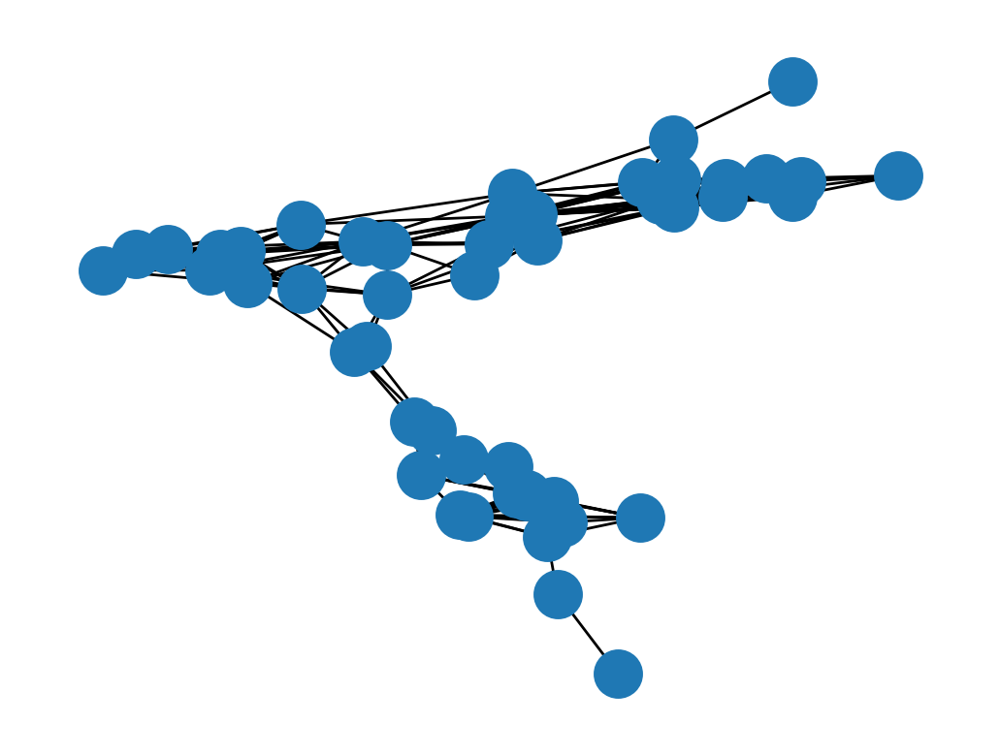

In [42]:
# draw the graph using the default spring layout
fig, ax = plt.subplots()
nx.draw(G, ax=ax)

Now, let's compare this to using `nx.draw_networkx`, which will automatically add labels to the nodes. Note the difference in information conveyed:

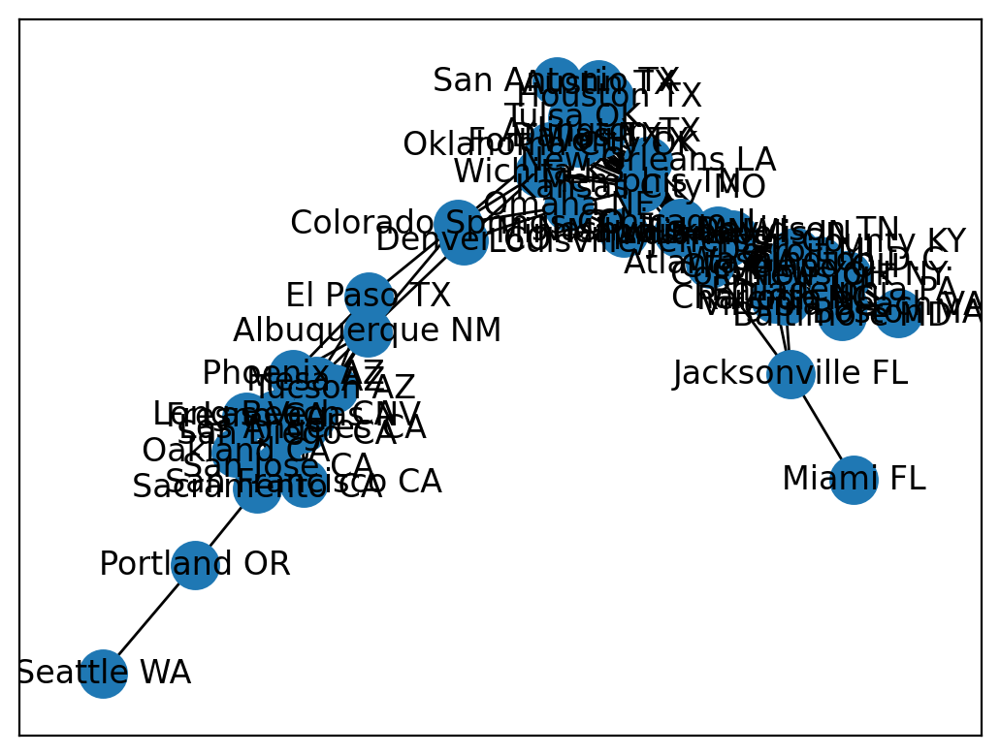

In [43]:
# draw the graph using the default spring layout and draw_networkx
fig, ax = plt.subplots()
nx.draw_networkx(G, ax=ax)

## How Are Nodes Positioned? Understanding Graph Layouts

The way nodes are arranged in a network plot—called the "layout"—can dramatically affect what you see and understand. Different layouts can reveal different patterns, such as clusters, hierarchies, or spatial relationships.

Let's look at the main layout algorithms provided by NetworkX and when to use each.

### Common Layout Algorithms in NetworkX

- **Spring layout (`nx.spring_layout`)**: The default. Simulates a physical system where nodes repel each other and edges act like springs. Good for general-purpose visualization.
- **Circular layout (`nx.circular_layout`)**: Places nodes evenly on a circle. Useful for highlighting cycles or for small networks.
- **Random layout (`nx.random_layout`)**: Places nodes randomly. Fast, but rarely useful for interpretation.
- **Shell layout (`nx.shell_layout`)**: Arranges nodes in concentric circles. Good for hierarchical or layered networks.
- **Spectral layout (`nx.spectral_layout`)**: Uses properties of the graph Laplacian. Can reveal clusters or bipartite structure.
- **Planar layout (`nx.planar_layout`)**: Tries to avoid edge crossings (only works for planar graphs).
- **Kamada-Kawai layout (`nx.kamada_kawai_layout`)**: Similar to spring layout, but optimizes distances based on shortest paths.
- **Multipartite and bipartite layouts**: For networks with clear groupings or two types of nodes.

**How to choose?**
- Try several layouts to see which best reveals the structure of your network.
- For spatial networks (like cities or streets), use real coordinates if available.

See the [NetworkX documentation](https://networkx.org/documentation/stable/reference/drawing.html#module-networkx.drawing.layout) for more details and examples.

### Exploring Available Layouts

Let's first check what layout algorithms are available in NetworkX. We can do this by listing all functions that end with "_layout":

In [44]:
# See what layouts are available in networkX
[x for x in nx.__dir__() if x.endswith('_layout')]

['bipartite_layout',
 'circular_layout',
 'forceatlas2_layout',
 'kamada_kawai_layout',
 'random_layout',
 'rescale_layout',
 'shell_layout',
 'spring_layout',
 'spectral_layout',
 'planar_layout',
 'fruchterman_reingold_layout',
 'spiral_layout',
 'multipartite_layout',
 'bfs_layout',
 'arf_layout']

### Setting Common Drawing Parameters

Before we compare different layouts, let's define a set of common visualization parameters that we'll use across all layouts. This ensures a fair comparison and cleaner code.

In [45]:
# Define common parameters
common_params = dict(node_size=20, width=0.1, node_color='white', edgecolors='black')

### Random Layout Example

Let's start by visualizing our network using a random layout. This places nodes randomly in the visualization space, which is rarely useful for interpretation but can be a good baseline.

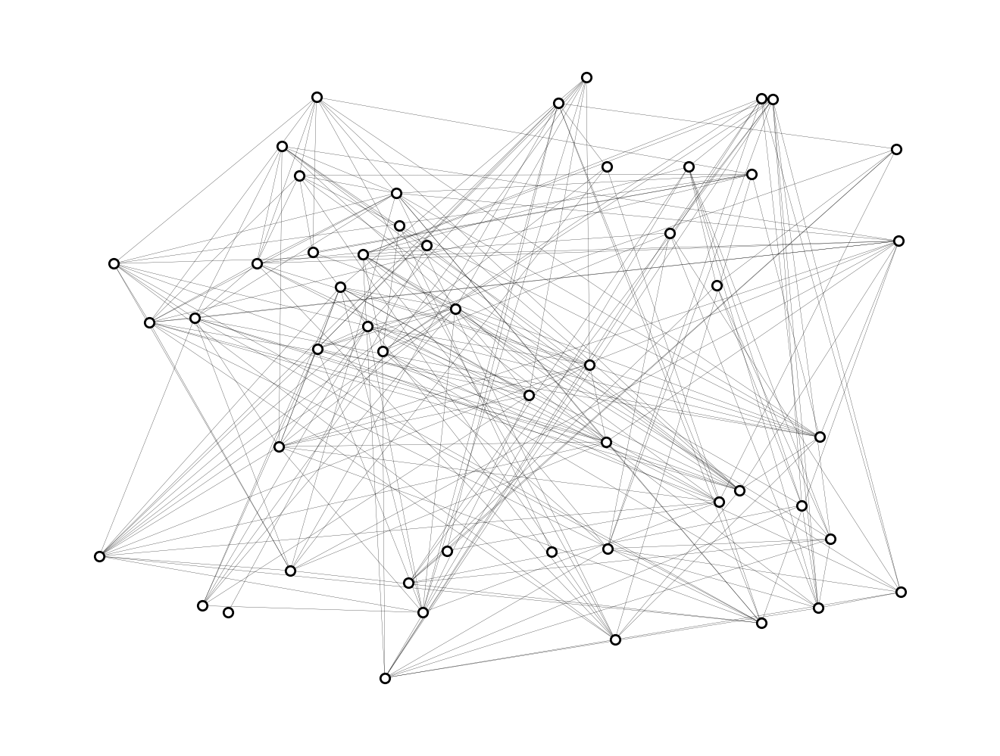

In [46]:
# Draw the graph using the random layout
plt.figure()
pos = nx.random_layout(G)
nx.draw(G, pos, **common_params)

### Comparing Multiple Layouts

Now, let's create a comparison of several layouts to see how they reveal different aspects of the network structure. Each subplot will show the same network with a different layout algorithm.

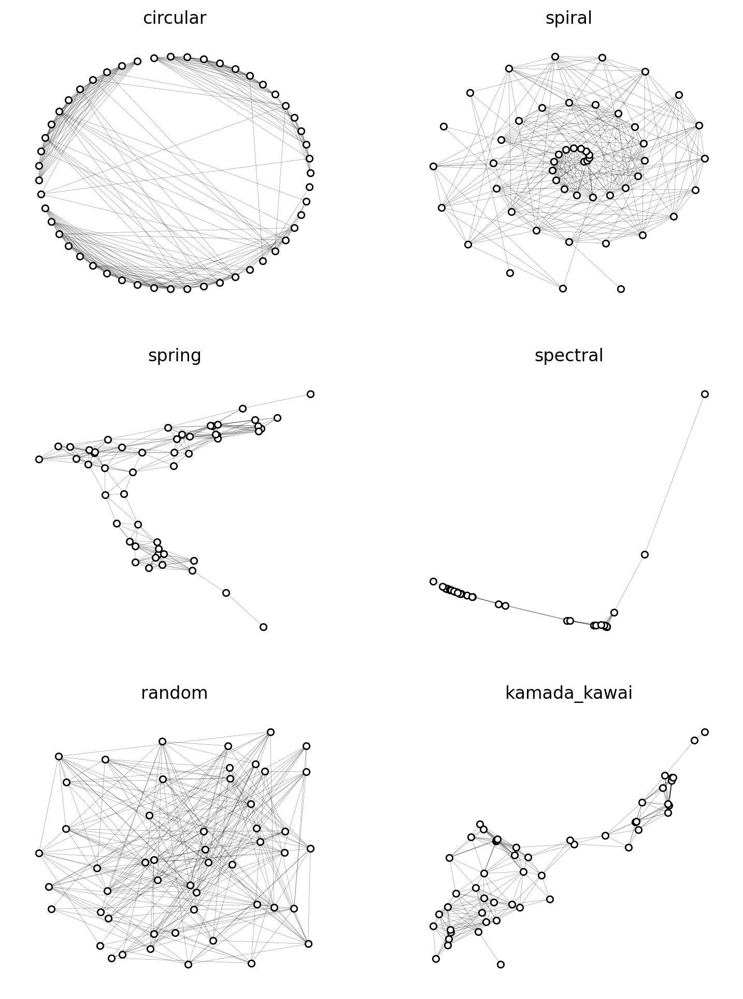

In [47]:
fig, axes = plt.subplots(3, 2, figsize=(9,12))  # Create a 3x3 grid of subplots

axes[0,0].set_title("circular")
axes[1,0].set_title("spring")
axes[2,0].set_title("random")
axes[0,1].set_title("spiral")
axes[1,1].set_title("spectral")
axes[2,1].set_title("kamada_kawai")

nx.draw(G, pos=nx.circular_layout(G), ax=axes[0,0], **common_params)
nx.draw(G, pos=nx.spring_layout(G), ax=axes[1,0], **common_params)
nx.draw(G, pos=nx.random_layout(G), ax=axes[2,0], **common_params)
nx.draw(G, pos=nx.spiral_layout(G), ax=axes[0,1], **common_params)
nx.draw(G, pos=nx.spectral_layout(G), ax=axes[1,1], **common_params)
nx.draw(G, pos=nx.kamada_kawai_layout(G), ax=axes[2,1], **common_params)


## Using Real-World Coordinates

Sometimes, your network nodes represent real places (like cities or intersections) and have geographic coordinates. In these cases, using the actual positions makes your visualization more meaningful and easier to interpret.

The next example shows how to use node attributes (like latitude and longitude) to position nodes on the plot.

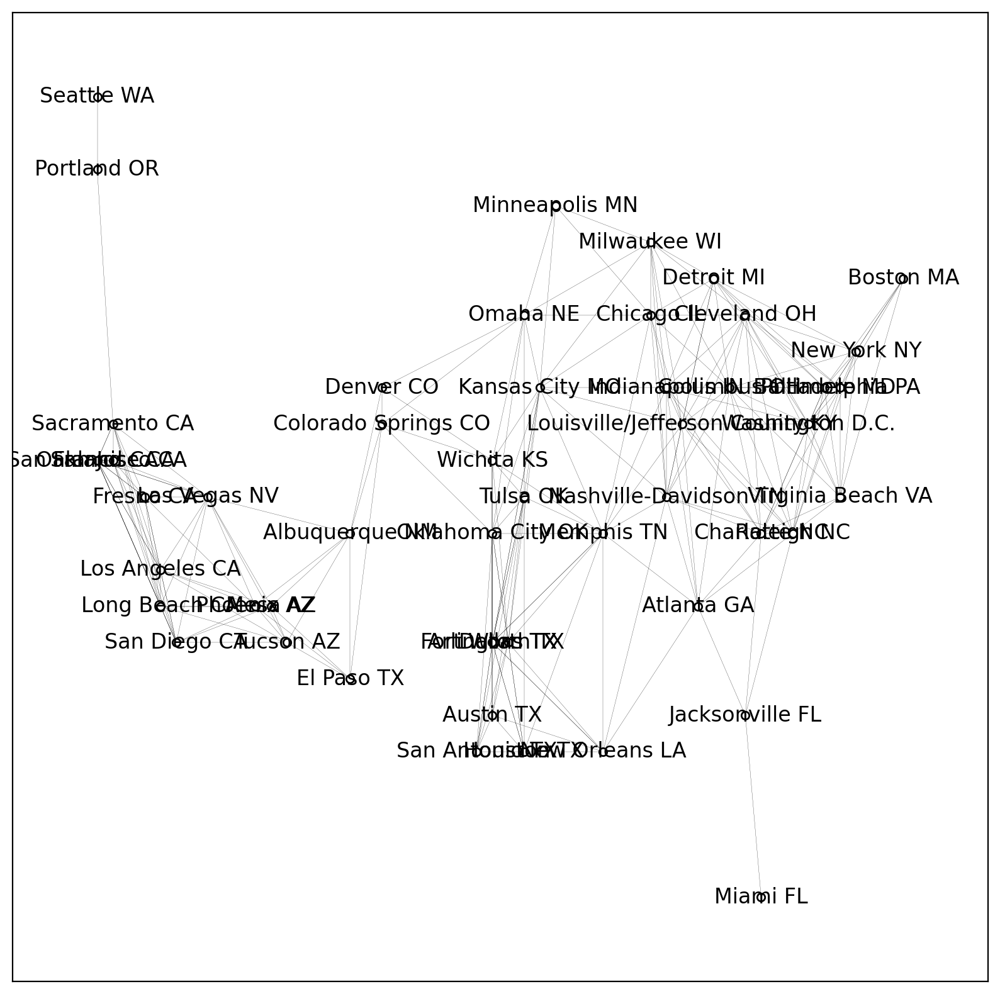

In [48]:
plt.figure(figsize=(10,10))
pos = nx.get_node_attributes(G, 'location')
nx.draw_networkx(G, pos, **common_params)

### Simplified Geographic View

We can create a cleaner version without labels for a better overview of the geographic structure:

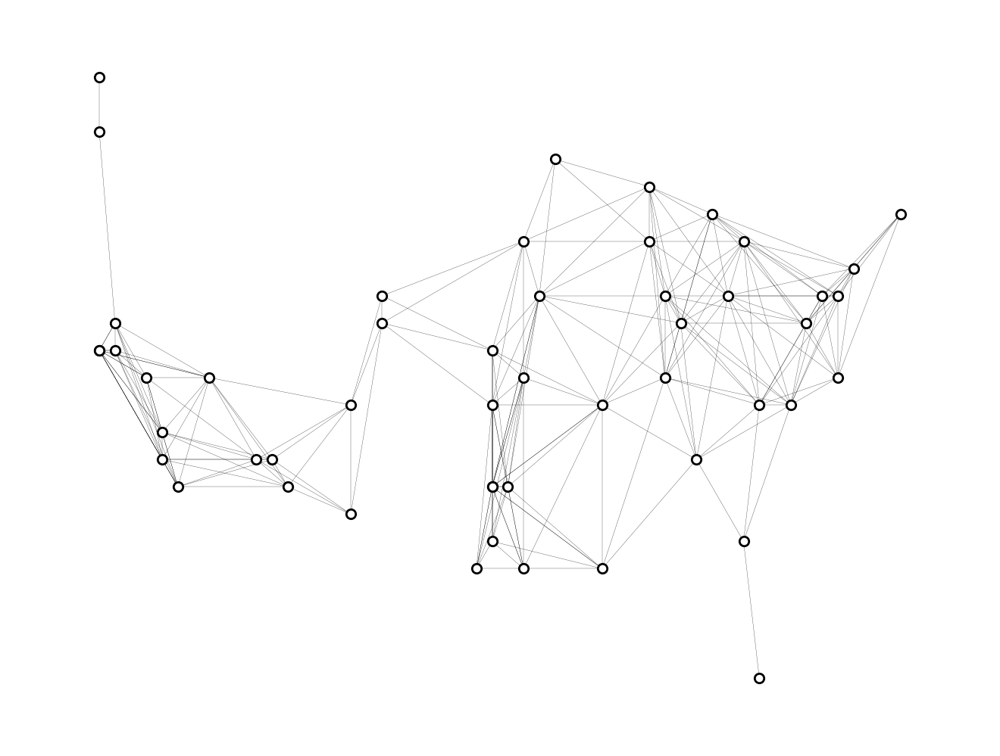

In [49]:
plt.figure()
nx.draw(G, pos, **common_params)

## Making Visualizations Data-Driven

A powerful feature of network visualization is the ability to map data attributes to visual properties. For example:
- Node size can represent population or centrality.
- Node color can show degree or another metric.
- Edge width can indicate the strength of a connection.

This approach helps you tell a richer story with your network, making important patterns and outliers stand out.

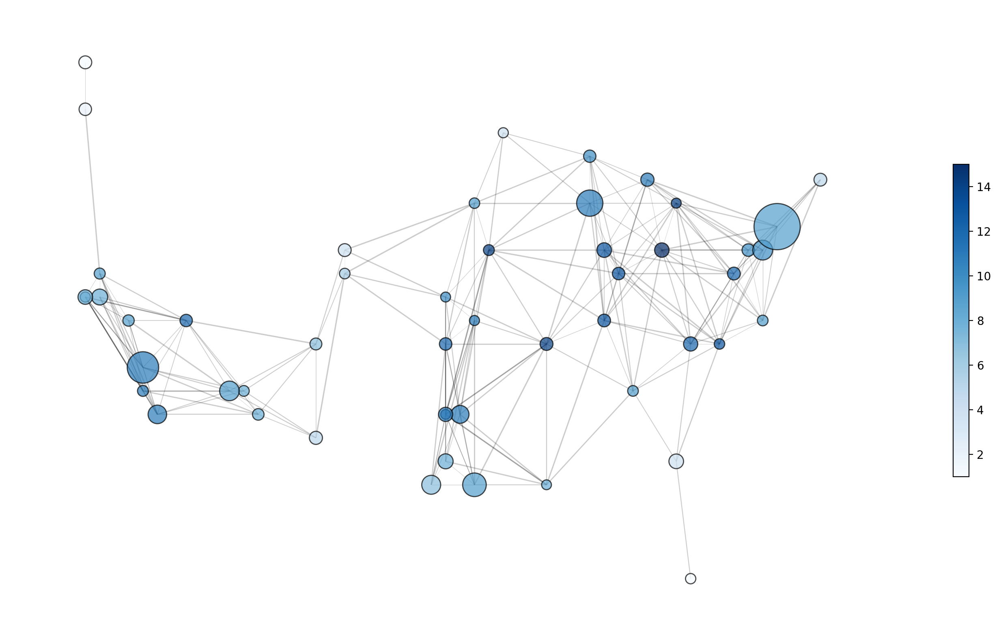

In [50]:
import matplotlib.colors as mcolors

degree_values = [G.degree(v) for v in G]
vmax = max(degree_values)
vmin = min(degree_values)

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
normv = [norm(current) for current in degree_values]

node_size = [0.0002*nx.get_node_attributes(G, 'population')[v] for v in G]
edge_width = [0.0015*G[u][v]['weight'] for u,v in G.edges()]

cmap = plt.cm.Blues

fig, ax = plt.subplots(figsize=(14,8))
ax.set_axis_off()

nx.draw_networkx_nodes(G, pos, node_size = node_size, node_color=normv, alpha=0.7, edgecolors="black", cmap=cmap, ax=ax)
nx.draw_networkx_edges(G, pos, width=edge_width, alpha=0.2, ax = ax)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

plt.colorbar(sm, shrink=0.5, ax =ax)
plt.tight_layout()


### Highlighting and Annotating Networks

To focus your audience's attention, you can highlight specific nodes or edges and add labels to key elements. This is especially useful when presenting results or explaining findings.

In the next example, we'll:
- Highlight edges above a certain weight.
- Label only selected nodes.
- Adjust label positions for clarity.

These techniques help make your visualizations more readable and informative.

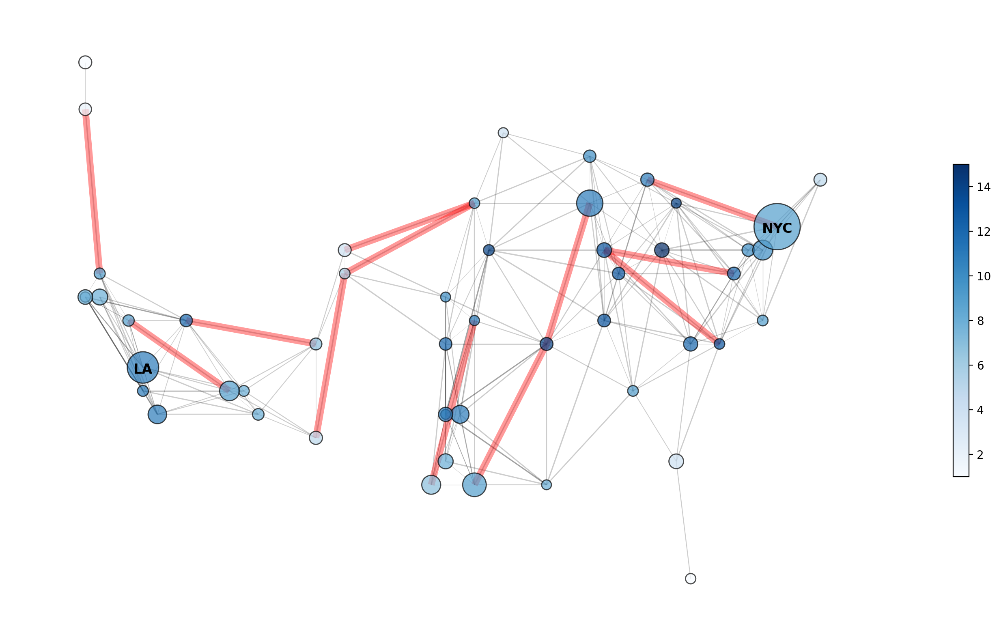

In [51]:
# Draw specific edges and add labels to specific nodes
fig, ax = plt.subplots(figsize=(14,8))
ax.set_axis_off()

nx.draw_networkx_nodes(G, pos, node_size = node_size, node_color=normv, alpha=0.7, edgecolors="black", cmap=cmap, ax=ax)
nx.draw_networkx_edges(G, pos, width=edge_width, alpha=0.2, ax = ax)

# Highlight edges in the top 5 percentile of the weight distribution
weights = [d['weight'] for _, _, d in G.edges(data=True)]
top_edges = [x for x in G.edges(data=True) if x[2]['weight'] >= np.percentile(weights, 95)]

nx.draw_networkx_edges(G, pos, edgelist=top_edges, edge_color='r', alpha=0.4, width=6)

# optional: change the relative position of the labels
label_pos = {node: (x, y-0.1) for node, (x, y) in pos.items()}

nx.draw_networkx_labels(G, label_pos, labels={'Los Angeles CA': 'LA', 'New York NY': 'NYC'}, 
                        font_size=12, font_weight='bold', font_color='black', horizontalalignment='center')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
plt.colorbar(sm, shrink=0.5, ax =ax)
plt.tight_layout()


### Adding Geographic Context: Basemaps

For spatial networks, overlaying your network on a map provides valuable context. This helps viewers relate the network structure to real-world geography.

In the following example, we'll add a simple basemap of the United States behind our network plot.

In [52]:
import geopandas as gpd

df = gpd.read_file("data/cb_2017_us_nation_5m/cb_2017_us_nation_5m.shp")
df

,AFFGEOID,GEOID,NAME,geometry
0,0100000US,US,United States,"MULTIPOLYGON (((-176.23625 51.82596, -176.2175..."


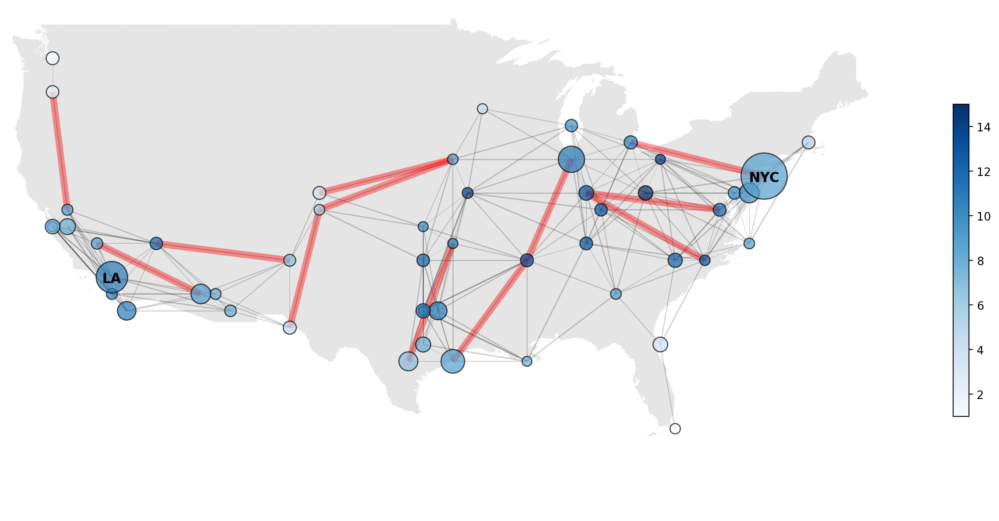

In [53]:
# Add a base map

fig, ax = plt.subplots(figsize=(14,8))
ax.set_xlim([-125, -65])
ax.set_ylim([20, 50])

df.plot(ax=ax, color='gray', alpha=.2)

ax.set_axis_off()

nx.draw_networkx_nodes(G, pos, node_size = node_size, node_color=normv, alpha=0.7, edgecolors="black", cmap=cmap, ax=ax)
nx.draw_networkx_edges(G, pos, width=edge_width, alpha=0.2, ax = ax)

# Highlight edges in the top 5 percentile of the weight distribution
weights = [d['weight'] for _, _, d in G.edges(data=True)]
top_edges = [x for x in G.edges(data=True) if x[2]['weight'] >= np.percentile(weights, 95)]

nx.draw_networkx_edges(G, pos, edgelist=top_edges, edge_color='r', alpha=0.4, width=6)

# optional: change the relative position of the labels
label_pos = {node: (x, y-0.1) for node, (x, y) in pos.items()}

nx.draw_networkx_labels(G, label_pos, labels={'Los Angeles CA': 'LA', 'New York NY': 'NYC'}, 
                        font_size=12, font_weight='bold', font_color='black', horizontalalignment='center')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
plt.colorbar(sm, shrink=0.5, ax =ax)
plt.tight_layout()


# Case Study: Game of Thrones Character Network

Let's put these techniques into practice by analyzing a real-world network: character interactions in the first book of Game of Thrones.

We'll see how to:
- Build the network from data.
- Visualize the overall structure.
- Highlight important characters and communities.
- Combine network plots with supporting charts for deeper insight.

This case study will help you connect the technical tools to real analysis and storytelling.

In [54]:
import pandas as pd

df = pd.read_csv('data/got/book1.csv')
df.head(2)

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1


In [55]:
GOT = nx.from_pandas_edgelist(df, 'Source', 'Target', edge_attr='weight')

## First Visualization

Let's create a basic visualization to get an overview of the character network structure. We'll use the default spring layout which tends to cluster connected characters together.

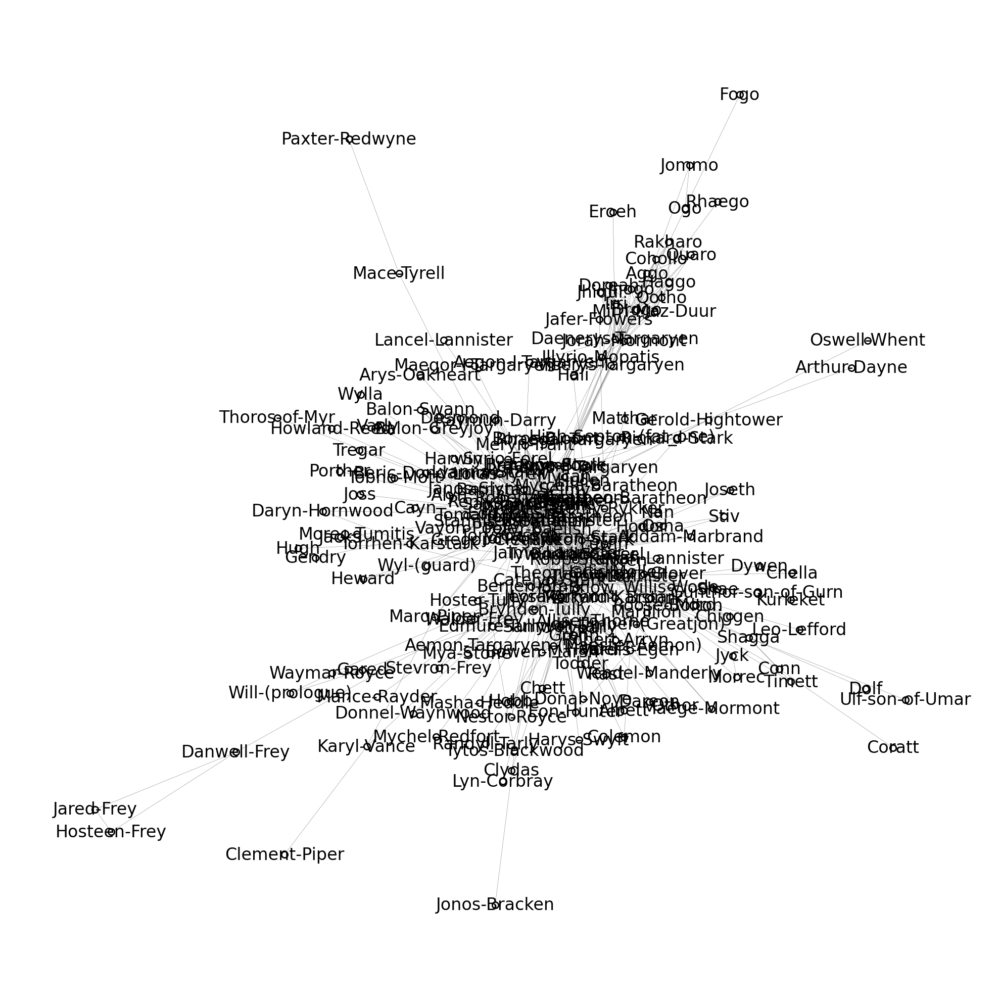

In [56]:
fig, ax = plt.subplots(figsize=(10,10))
nx.draw_networkx(GOT, ax=ax, **common_params)
ax.set_axis_off()
plt.tight_layout()

### Improving Readability and Insight

Dense networks can be hard to interpret. By scaling edge widths, adjusting layouts, and selectively labeling nodes, we can make the structure clearer and highlight key relationships.

We'll also see how to use color and size to encode additional information, making the plot more informative at a glance.

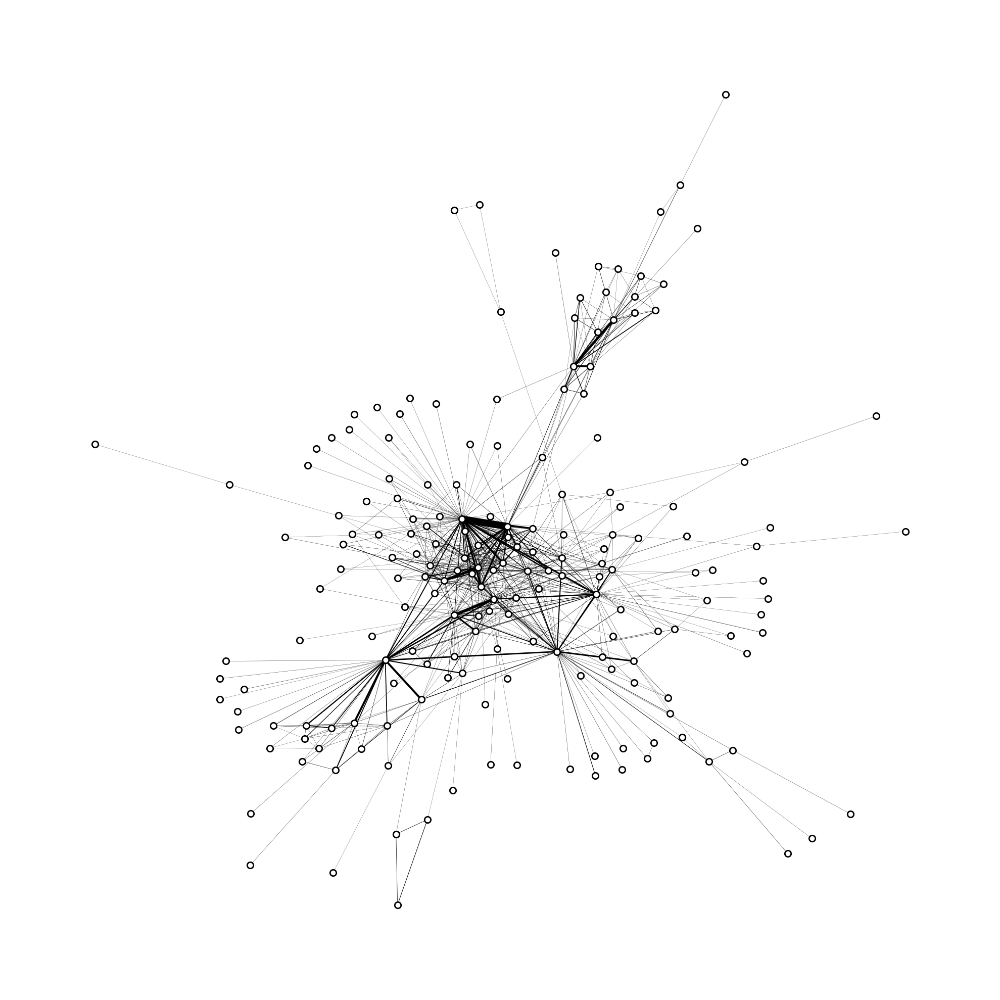

In [57]:
from sklearn.preprocessing import MinMaxScaler

common_node_params = dict(node_size=20, node_color='white', edgecolors='black')

scaler = MinMaxScaler(feature_range=(0.1,5))

weights = [n[2]["weight"] for n in GOT.edges(data=True)]
scaled_weights = scaler.fit_transform([[d] for d in weights]).flatten()

fig, ax = plt.subplots(figsize=(10,10))

pos = nx.spring_layout(GOT, weight=None, k=0.2,  iterations=500, seed=42)

nx.draw_networkx_nodes(GOT, pos=pos, **common_node_params)
nx.draw_networkx_edges(GOT, pos, width=scaled_weights)

ax.set_axis_off()
plt.tight_layout()

### The Challenge of Labels

Adding labels to every node in a large network can make the plot unreadable. In practice, it's often better to label only the most important nodes or use interactive tools for exploration.

We'll demonstrate both the limitations and some workarounds for static label placement.

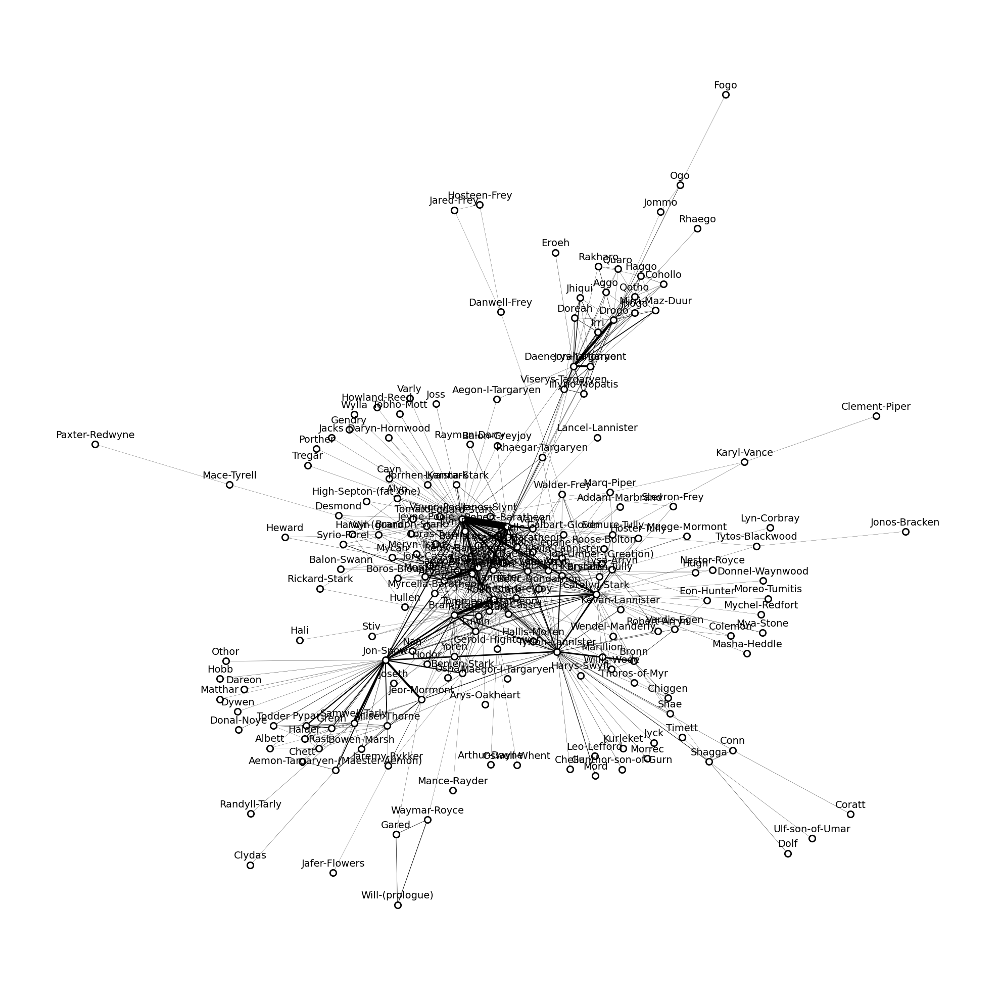

In [58]:
fig, ax = plt.subplots(figsize=(10,10))

label_pos = {node: (x, y+0.02) for node, (x, y) in pos.items()}

nx.draw_networkx_nodes(GOT, pos=pos, **common_node_params)
nx.draw_networkx_edges(GOT, pos, width=scaled_weights)
nx.draw_networkx_labels(GOT, label_pos, font_size=7)

ax.set_axis_off()
plt.tight_layout()

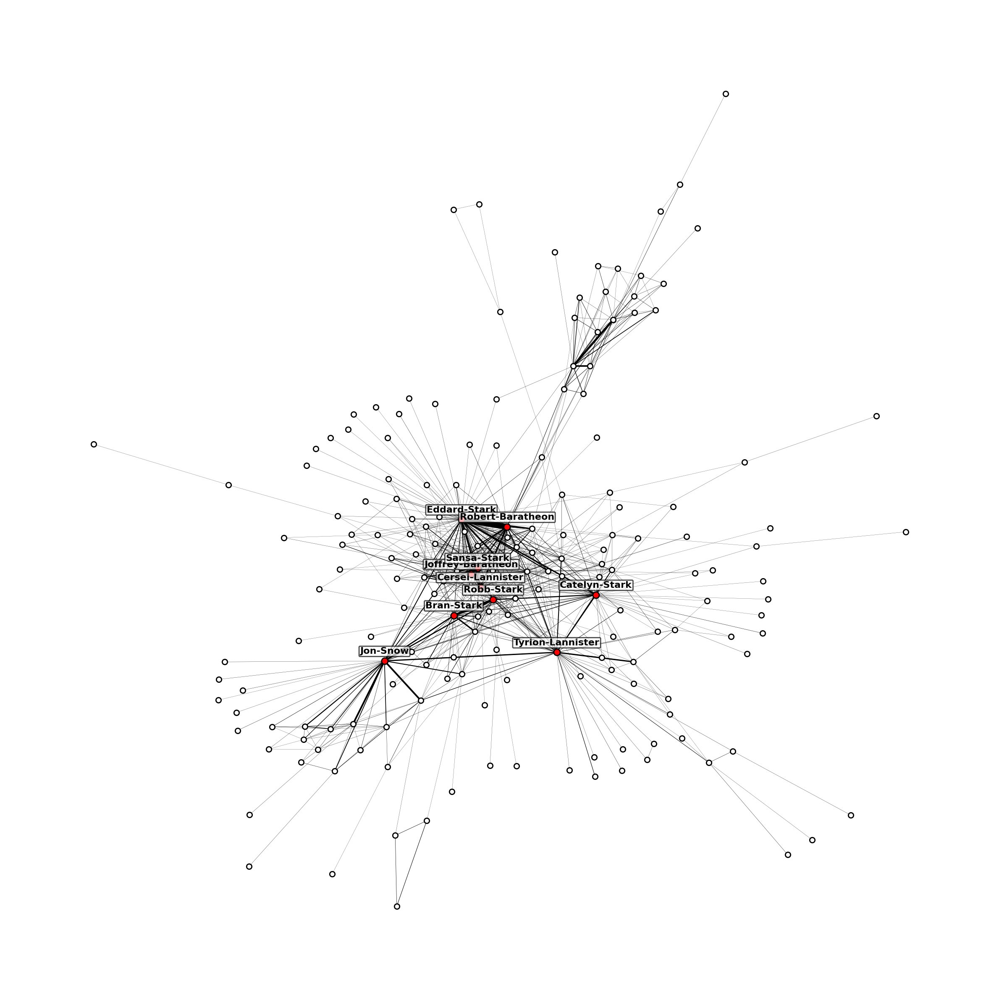

In [59]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(12,12))

# Calculate node degrees
degrees = dict(GOT.degree())
threshold = np.percentile(list(degrees.values()), 95)

# Select nodes above the threshold
top_nodes = [node for node, deg in degrees.items() if deg >= threshold]

# Create label positions slightly offset for top nodes
top_label_pos = {node: (pos[node][0], pos[node][1]+0.02) for node in top_nodes}

# Draw the regular nodes
regular_nodes = [node for node in GOT.nodes() if node not in top_nodes]
nx.draw_networkx_nodes(GOT, pos, nodelist=regular_nodes, ax=ax, **common_node_params)

# Draw the top nodes in red
nx.draw_networkx_nodes(GOT, pos, nodelist=top_nodes, node_size=30, node_color='red', edgecolors='black', ax=ax)

# Draw edges
nx.draw_networkx_edges(GOT, pos, width=scaled_weights, ax=ax)

# Create labels for top nodes with white background for better readability
labels = {node: node for node in top_nodes}
bbox_props = dict(boxstyle="round,pad=0.1", fc="white", ec="black", alpha=0.7)
nx.draw_networkx_labels(GOT, top_label_pos, labels=labels, font_size=8, font_weight='bold', bbox=bbox_props)

ax.set_axis_off()
plt.tight_layout()


### Detecting and Visualizing Communities

Community detection algorithms help us find groups of nodes that are more connected to each other than to the rest of the network. In social networks, these often correspond to factions, families, or other meaningful groups.

We'll use the Louvain method to find communities in the Game of Thrones network and visualize them with different colors.

In [60]:
communities = nx.community.louvain_communities(GOT)

# Set node attribute reflecting the community membership
for i, community in enumerate(communities):
    for node in community:
        GOT.nodes[node]['community'] = i

In [61]:
GOT.nodes()["Mord"]["community"]

3

In [62]:
from matplotlib.colors import ListedColormap

# Create a colormap
colors = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
cmap = ListedColormap(colors)

node_colors = [GOT.nodes()[node]["community"] for node in GOT.nodes()]

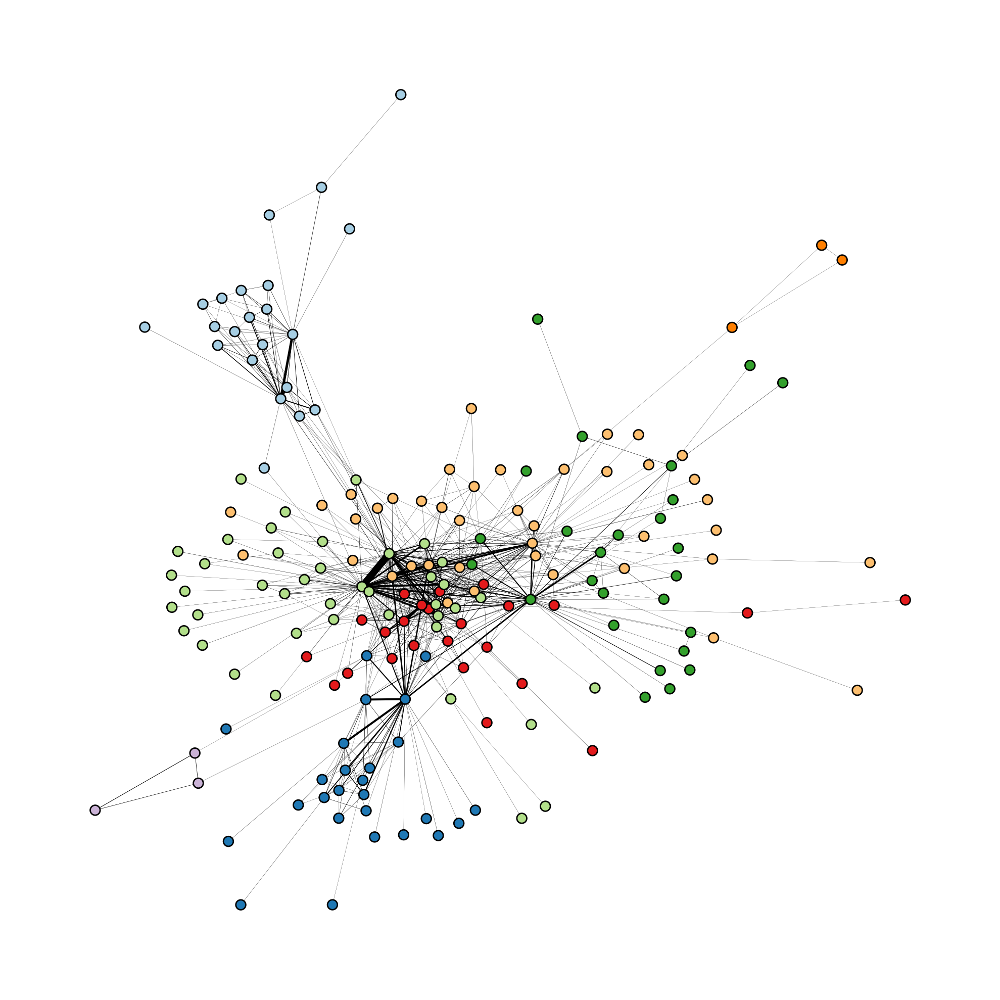

In [63]:
fig, ax = plt.subplots(figsize=(10,10))

pos = nx.spring_layout(GOT, k=2, iterations=1000, weight="weigth", seed=42)

nx.draw_networkx_nodes(GOT, pos=pos, node_color=node_colors, node_size=50, linewidths=1, edgecolors='black',   cmap=cmap)
nx.draw_networkx_edges(GOT, pos, width=scaled_weights)

ax.set_axis_off()
plt.tight_layout()

### Adding Betweenness Centrality

Betweenness centrality measures how often a node appears on the shortest paths between other nodes. Characters with high betweenness are often "bridge" characters that connect different communities. Let's calculate this metric and add it to our node attributes.

In [64]:
nx.set_node_attributes(GOT, nx.betweenness_centrality(GOT), name="bc")

### Creating a Custom Data Scaling Function

To visualize node sizes based on betweenness centrality, we need to scale the values to a suitable range. Let's create a utility function for this:

In [65]:
# Define a custom data scaler
def scale(arr, minv=50, maxv=200):
    prop_v = np.array(arr)
    scaler = MinMaxScaler(feature_range=(minv,maxv))
    scaled_prop_v = scaler.fit_transform(prop_v.reshape(-1, 1)).flatten()
    return scaled_prop_v

### Scaling Node Sizes and Edge Widths

Let's apply our scaling function to both betweenness centrality (for node sizes) and edge weights (for edge widths) to create a more informative visualization:

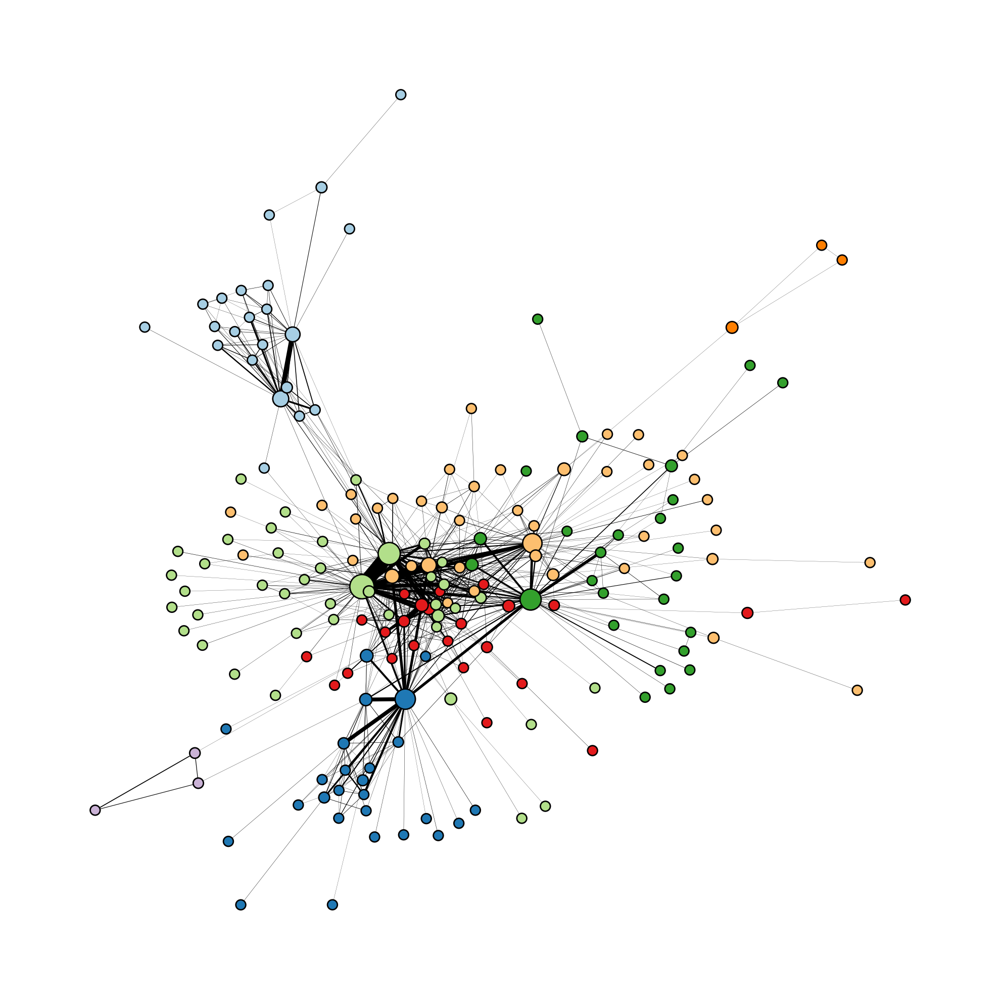

In [66]:
# get betweenness array 
scaled_node_size = scale(list(nx.get_node_attributes(GOT, "bc").values()), minv=50, maxv=300)
scaled_edge_width = scale(list(nx.get_edge_attributes(GOT, "weight").values()), minv=0.1, maxv=10)

fig, ax = plt.subplots(figsize=(10,10))

nx.draw_networkx_nodes(GOT, pos=pos, node_color=node_colors, node_size=scaled_node_size, linewidths=1, edgecolors='black',   cmap=cmap)
nx.draw_networkx_edges(GOT, pos, width=scaled_edge_width)

ax.set_axis_off()
plt.tight_layout()

### Adding a Legend for Communities

Let's improve our visualization by adding a legend that identifies each community by color. This makes it easier to interpret the different groups in the network.

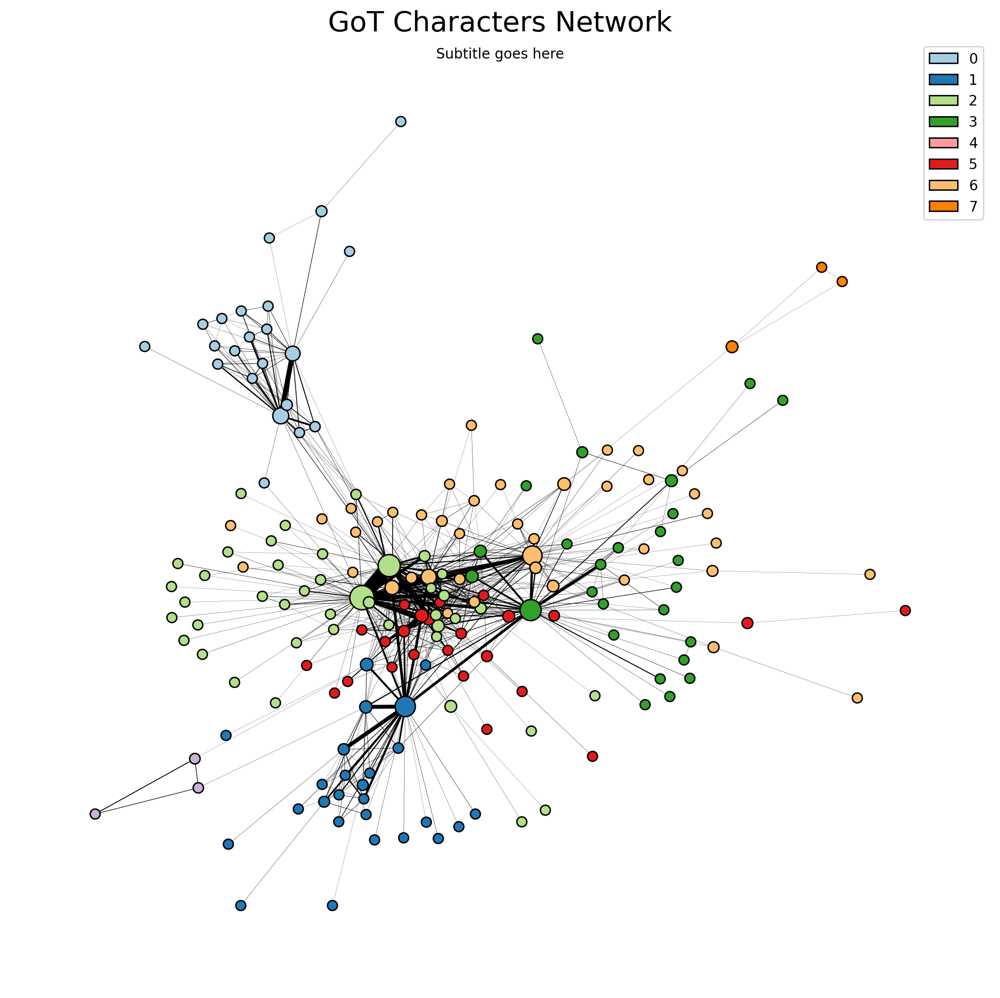

In [67]:
import matplotlib.patches as mpatches

# Create a patch for each community
patches = [mpatches.Patch(facecolor=color, label=community, edgecolor='black', linewidth=1) for community, color in zip(range(len(communities)), colors)]

fig, ax = plt.subplots(figsize=(10,10))

nx.draw_networkx_nodes(GOT, pos=pos, node_color=node_colors, node_size=scaled_node_size, linewidths=1, edgecolors='black',   cmap=cmap)
nx.draw_networkx_edges(GOT, pos, width=scaled_edge_width)

ax.set_axis_off()
ax.set_title("GoT Characters Network", fontsize=20)
ax.text(x=0.5, y=0.98, s='Subtitle goes here', fontsize=10, ha='center', transform=ax.transAxes)
plt.legend(handles=patches)
plt.tight_layout()

### Telling a Story with Multiple Plots

Combining several plots—such as the main network, supporting charts, and zoomed-in views—can help you tell a richer story and guide your audience through your analysis.

The next example shows how to create a multi-panel figure that brings together different perspectives on the Game of Thrones network.

### Analyzing Character Interactions

Let's first calculate how many interactions each character has, which will give us insight into which characters are most active in the story:

In [68]:
interactions_per_character = df.groupby('Source')['Target'].count()

### Creating a Multi-Panel Visualization

Now, let's create a comprehensive visualization that combines:
1. The main network with communities and centrality
2. A histogram showing the distribution of character interactions
3. A zoomed-in view of a specific community
4. A complementary cumulative distribution function (CCDF) of node degrees in log-log scale

This creates a rich, multi-faceted view of the Game of Thrones character network.

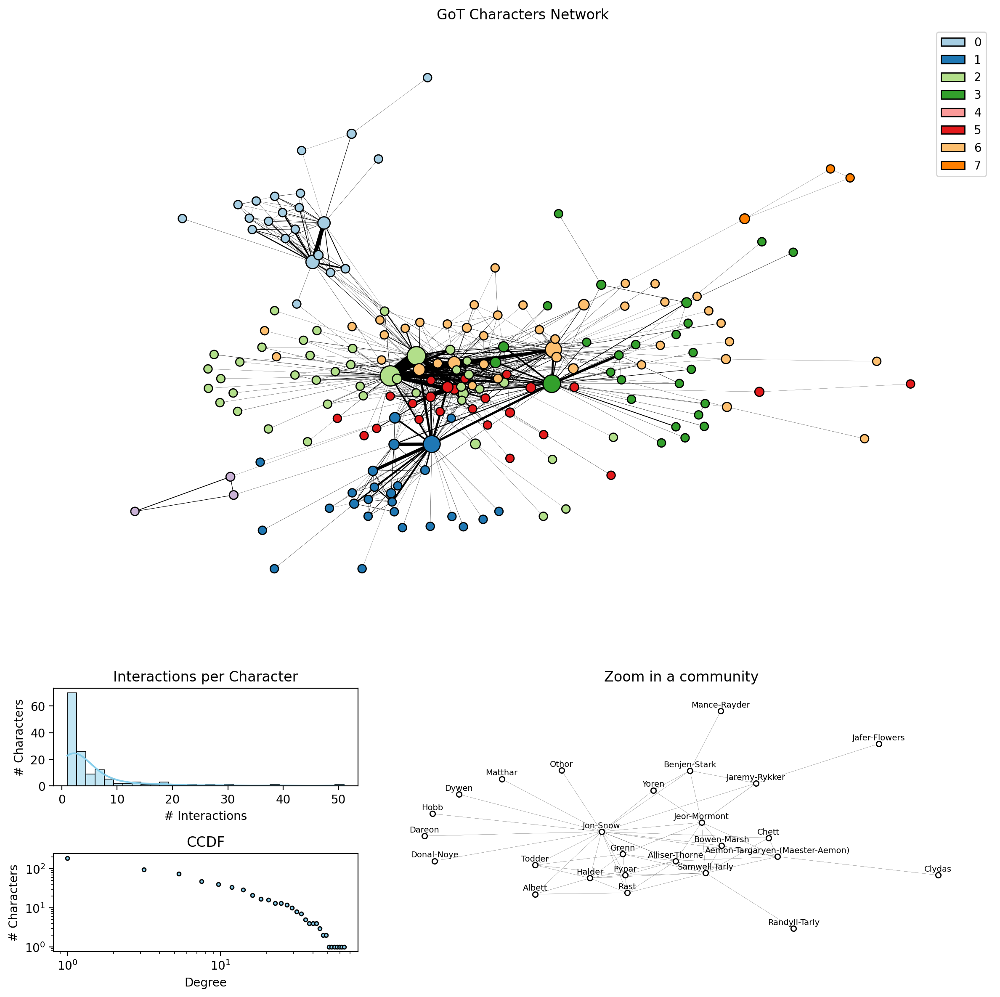

In [69]:
import seaborn as sns

# Create a figure
fig = plt.figure(figsize=(12,12))

# Create the first subplot that takes the entire first line
ax1 = plt.subplot2grid((6, 6), (0, 0), colspan=6, rowspan=4)

# Create the second and third subplots in the second line
ax2 = plt.subplot2grid((6, 6), (4, 0), colspan=2, rowspan=1)
ax3 = plt.subplot2grid((6, 6), (4, 2), colspan=4, rowspan=2)
ax4 = plt.subplot2grid((6, 6), (5, 0), colspan=2, rowspan=1)

# Main network
nx.draw_networkx_nodes(GOT, pos, node_color=node_colors, node_size=scaled_node_size, linewidths=1, edgecolors='black',   cmap=cmap, ax=ax1)
nx.draw_networkx_edges(GOT, pos, width=scaled_edge_width, ax=ax1)

ax1.set_axis_off()
ax1.set_title("GoT Characters Network", fontsize=12)
ax1.legend(handles=patches)

# Distribution of Interactions per Character
sns.histplot(interactions_per_character, bins=30, color='skyblue', edgecolor='black', kde=True, ax=ax2)
ax2.set_title('Interactions per Character', fontsize=12)
ax2.set_xlabel('# Interactions', fontsize=10)
ax2.set_ylabel('# Characters', fontsize=10)

# A zoom in a particular community
GOT_sub = GOT.subgraph(communities[1])
pos_sub = nx.spring_layout(GOT_sub, iterations=500, weight="weigth")
label_pos = {node: (x, y+0.05) for node, (x, y) in pos_sub.items()}

nx.draw_networkx_nodes(GOT_sub, pos_sub, ax=ax3, **common_node_params)
nx.draw_networkx_edges(GOT_sub, pos_sub, width=0.1, ax=ax3)
nx.draw_networkx_labels(GOT_sub, label_pos, ax=ax3, font_size=7)

ax3.set_axis_off()
ax3.set_title("Zoom in a community", fontsize=12)


# Get the degree of each node
degrees = [degree for node, degree in GOT.degree()]

# Calculate the complementary cumulative distribution
counts, bin_edges = np.histogram(degrees, bins=30)
cum_counts = np.cumsum(counts[::-1])[::-1]
bin_edges = bin_edges[:-1]

# Plot the complementary cumulative distribution in a log-log scale
ax4.scatter(bin_edges, cum_counts, s=10,  color="skyblue", edgecolor='black')
ax4.set_xscale('log')
ax4.set_yscale('log')
ax4.set_title('CCDF', fontsize=12)
ax4.set_xlabel('Degree', fontsize=10)
ax4.set_ylabel('# Characters', fontsize=10)


plt.tight_layout()

# Visualizing Street Networks

Street networks are a special type of spatial network, where nodes represent intersections and edges represent street segments. Unlike abstract networks, these are embedded in real geographic space.

Studying street networks can reveal:
- Urban planning patterns
- Accessibility and connectivity
- Differences between cities or neighborhoods

We'll use the OSMnx library to download, analyze, and visualize street networks from OpenStreetMap data.

### Downloading Street Network Data

Let's download street network data for Moncalieri, Italy using OSMnx. The library makes it easy to fetch and process OpenStreetMap data for network analysis. We'll get a walkable street network, which includes pedestrian paths.

In [70]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Specify the name of the city
city = "Moncalieri, IT"

# Create a graph from the OpenStreetMap data
C = ox.graph_from_place(city, network_type='walk')

# Convert the graph into a NetworkX graph
G_nx = nx.relabel.convert_node_labels_to_integers(C)

### Examining the Node Data

Let's look at what information is included in a node of our street network. This shows us the attributes available for each intersection:

In [71]:
next(iter(C.nodes(data=True)))

(31800433, {'y': 45.0003332, 'x': 7.6944442, 'street_count': 3})

### Examining the Edge Data

Similarly, let's inspect the attributes of an edge (street segment) in our network:

In [72]:
next(iter(C.edges(data=True)))

(31800433,
 2069017864,
 {'osmid': 134635048,
  'highway': 'primary',
  'lanes': '2',
  'maxspeed': '50',
  'name': 'Via Tenivelli',
  'oneway': False,
  'reversed': True,
  'length': np.float64(40.578224385686624)})

### Why Layout Matters for Street Networks

If you use a standard graph layout (like spring layout) for a street network, you lose the real-world spatial relationships between intersections and streets. For meaningful analysis and interpretation, it's important to use the actual geographic coordinates provided in the data.

The next examples show the difference between abstract and spatial layouts for street networks.

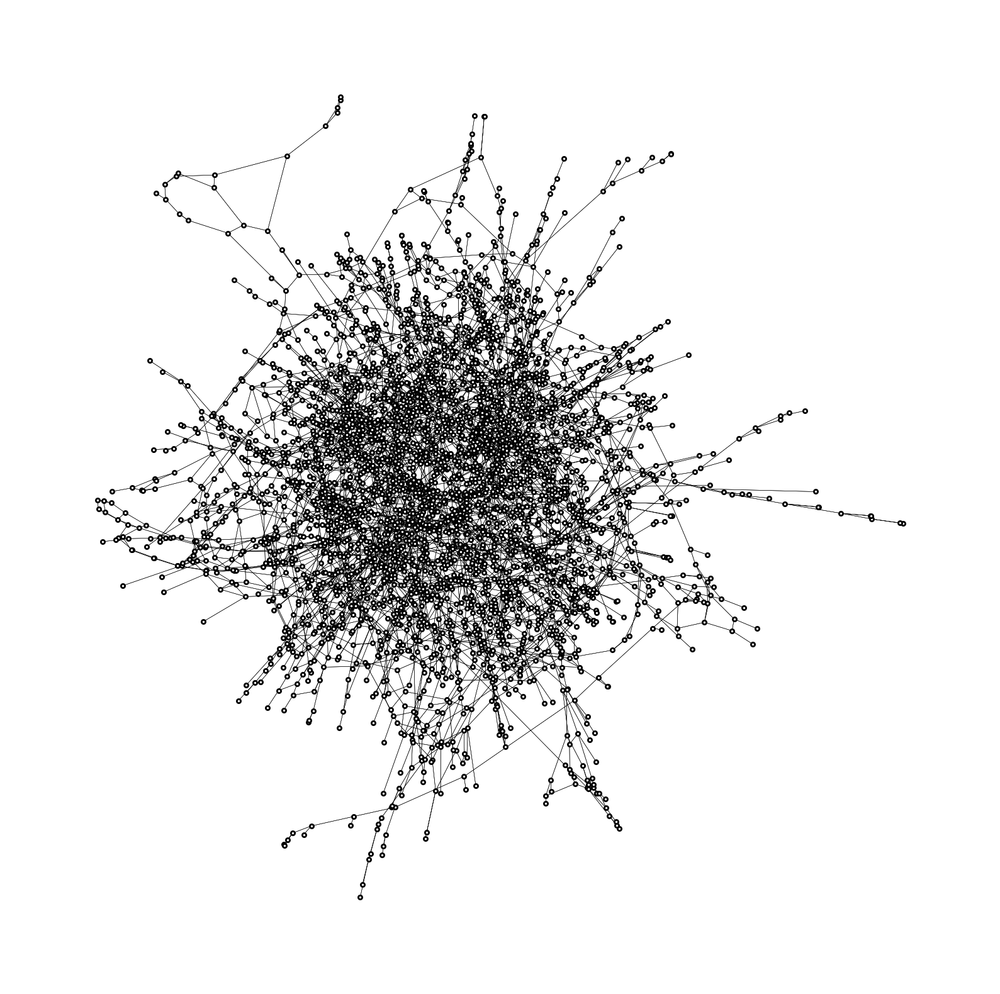

In [73]:
pos = nx.spring_layout(G_nx, iterations=100, weight="length")

fig, ax = plt.subplots(figsize=(10,10))
ax.set_axis_off()

nx.draw_networkx_nodes(G_nx, pos, node_size=5, node_color='white', edgecolors='black', ax=ax)
nx.draw_networkx_edges(G_nx, pos, width=0.2, arrows=False, ax=ax)

### Using Geographic Coordinates

Now, let's use the actual geographic coordinates (x, y) for each node. This preserves the real spatial layout of the street network:

In [74]:
x = list(nx.get_node_attributes(G_nx, 'x').values())
y = list(nx.get_node_attributes(G_nx, 'y').values())
pos = np.vstack((x, y)).T

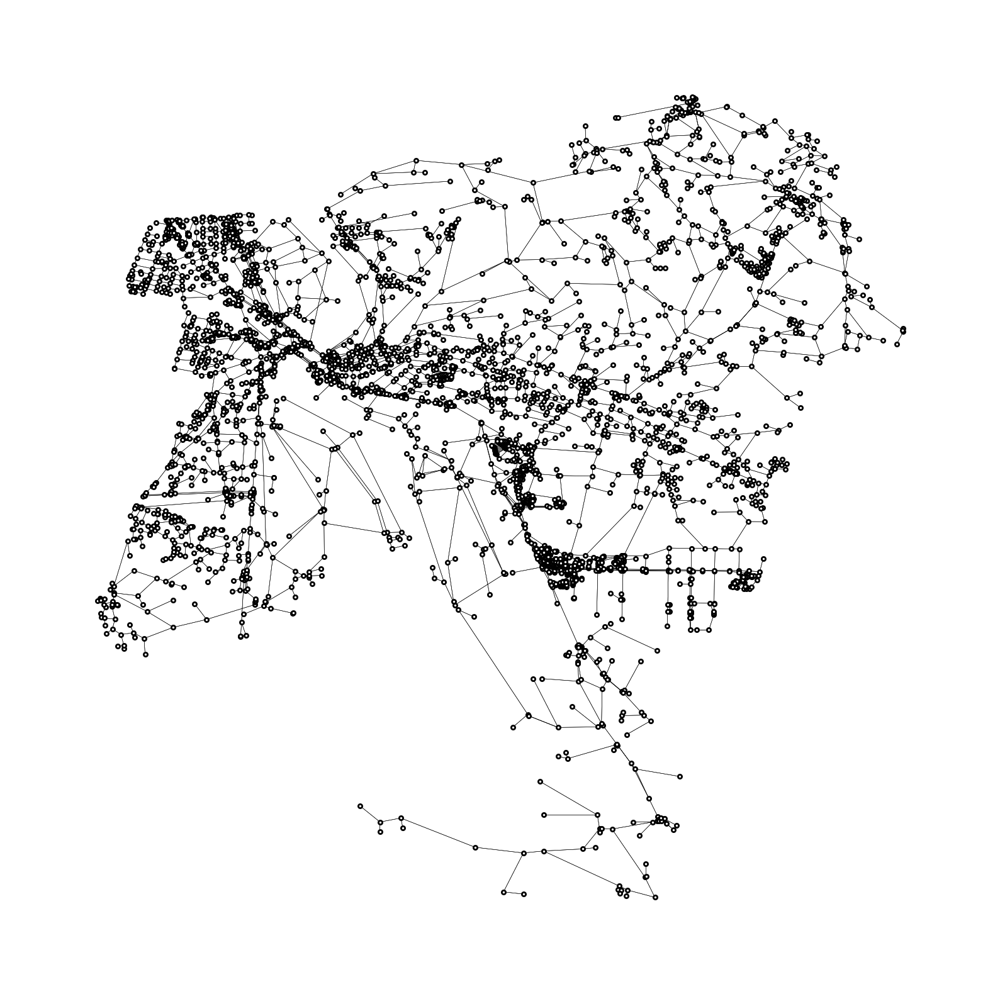

In [75]:
fig, ax = plt.subplots(figsize=(10,10))
ax.set_axis_off()

nx.draw_networkx_nodes(G_nx, pos, node_size=5, node_color='white', edgecolors='black', ax=ax)
nx.draw_networkx_edges(G_nx, pos, width=0.2, arrows=False, ax=ax)

The previous method does not consider that a street segment is a LineString that could be not a straight line

### Using GeoDataFrames for Accurate Street Geometry

For a more accurate representation, we should use the full geometry of each street segment, not just the endpoints. OSMnx provides a function to convert the network to GeoDataFrames, which preserve the complete LineString geometries:

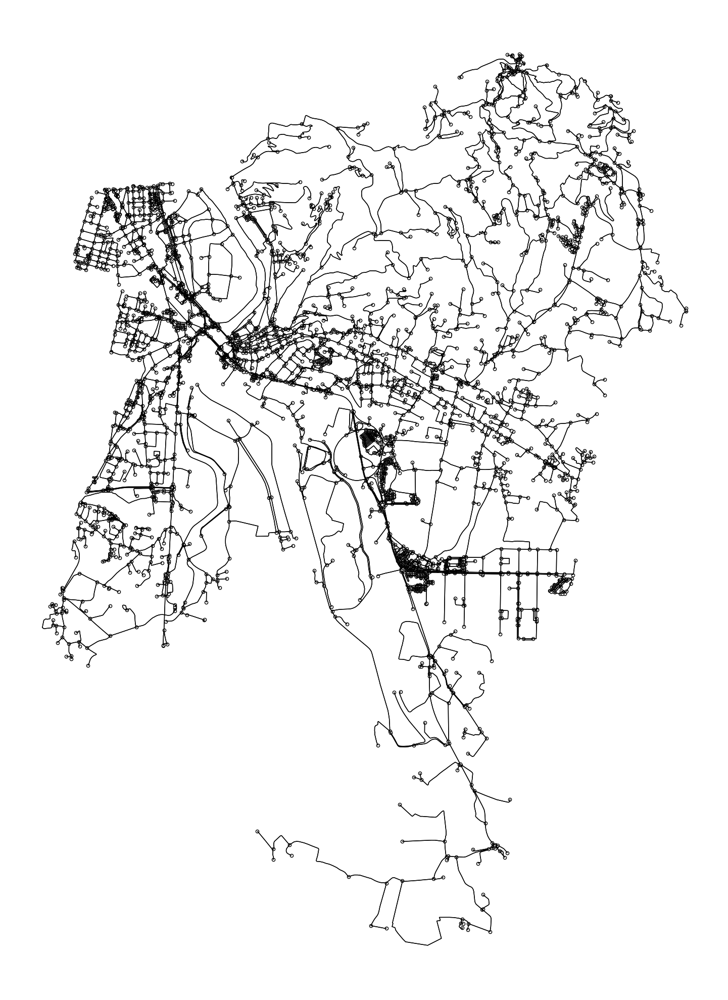

In [76]:
# Convert the graph into a GeoDataFrame
gdf_nodes, gdf_edges = ox.graph_to_gdfs(C)

# Plot the GeoDataFrame
fig, ax = plt.subplots(figsize=(10,10))
gdf_edges.plot(ax=ax, linewidth=0.5, edgecolor='black')
gdf_nodes.plot(ax=ax, markersize=5, facecolor="white", edgecolor='black', linewidth=0.5)
ax.axes.set_axis_off()
plt.tight_layout()

### Using OSMnx's Built-in Plotting Functions

OSMnx also provides specialized plotting functions that are optimized for street networks. These functions handle the complexity of street geometry automatically and offer additional customization:

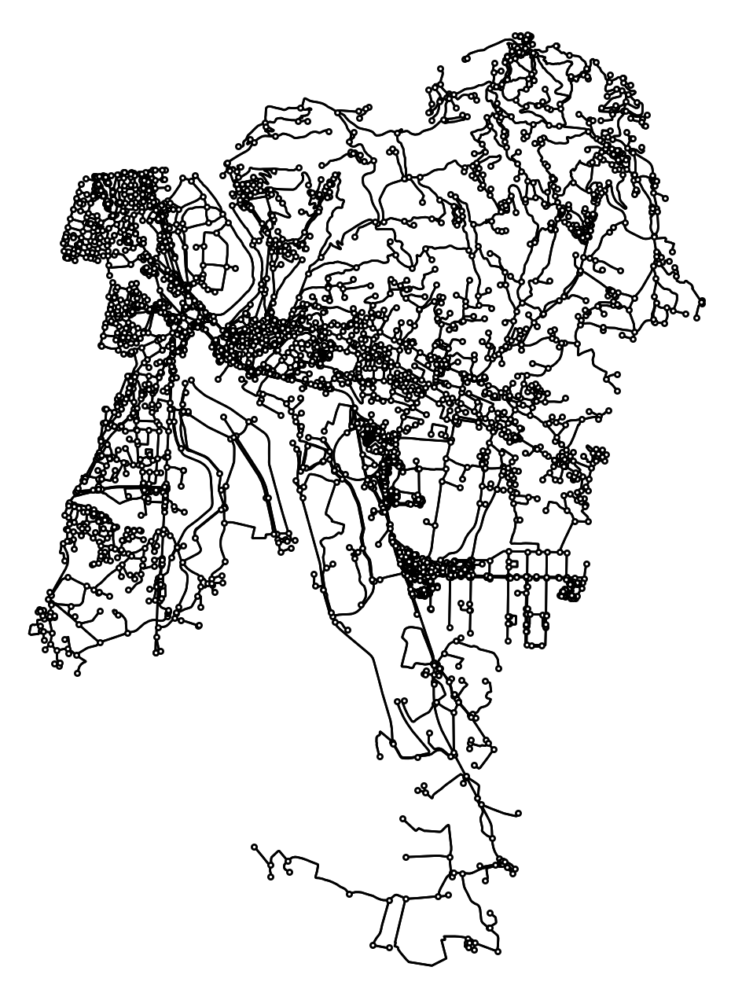

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [77]:
ox.plot_graph(C, bgcolor="white", edge_color="black", edge_alpha=1.0, node_color="white", node_edgecolor="black", node_size=5)

### Exercise:

Visualize the networks from the Les Miserables (`nx.les_miserables_graph()`) or the Karate Club (`nx.karate_club_graph()`). 

In this exercise, you should apply the techniques we've learned to visualize:

1. The Karate Club network, a classic social network dataset showing friendship ties between members of a university karate club

Try different layouts, explore community detection, and experiment with various visual attributes to create an informative visualization.